In [0]:
%tensorflow_version 2.x
import tensorflow as tf
import numpy as np
import cv2,os,glob

In [3]:
train_records = glob.glob('/content/drive/My Drive/Opacity-Detection-Data/TFRecords/Train/*.tfrecord')
train_records1 = glob.glob('/content/drive/My Drive/Opacity-Detection-Data/TFRecords/*.tfrecord')
val_records = glob.glob('/content/drive/My Drive/Opacity-Detection-Data/TFRecords/Test/*.tfrecord')
print(len(train_records),len(val_records))

train_dataset = tf.data.TFRecordDataset(train_records,num_parallel_reads=20)
val_dataset = tf.data.TFRecordDataset(val_records,num_parallel_reads=5)
train_dataset1 = tf.data.TFRecordDataset(train_records1,num_parallel_reads=20)

image_feature_description = {
        'image_raw': tf.io.FixedLenFeature([], tf.string),
        'label': tf.io.FixedLenFeature([], tf.int64),
}

float_image_feature_description = {
        'image_raw': tf.io.FixedLenFeature([], tf.string),
        'label': tf.io.FixedLenFeature([], tf.float32),
}


def _parse_image_function(example_proto):
  features = tf.io.parse_single_example(example_proto, image_feature_description)
  image_raw = tf.image.decode_jpeg(features['image_raw'],channels=1)
  image_raw = tf.image.random_brightness(image_raw,max_delta=0.3)
  image_raw = tf.image.random_contrast(image_raw,lower=0.2,upper=1.2)
  image_raw = tf.cast(image_raw , tf.float32) * (1. / 255)
  image_raw = tf.image.resize(image_raw,(400,400))
  label = tf.reshape(features['label'],shape=(1,))

  return image_raw,label

def _parse_val_image_function(example_proto):
  features = tf.io.parse_single_example(example_proto, image_feature_description)
  image_raw = tf.image.decode_jpeg(features['image_raw'],channels=1)
  image_raw = tf.cast(image_raw , tf.float32) * (1. / 255)
  image_raw = tf.image.resize(image_raw,(400,400))
  label = tf.reshape(features['label'],shape=(1,))

  return image_raw,label  

def float_parse_image_function(example_proto):
  features = tf.io.parse_single_example(example_proto, float_image_feature_description)
  image_raw = tf.image.decode_jpeg(features['image_raw'],channels=1)
  image_raw = tf.image.random_brightness(image_raw,max_delta=0.3)
  image_raw = tf.image.random_contrast(image_raw,lower=0.2,upper=1.2)
  image_raw = tf.cast(image_raw , tf.float32) * (1. / 255)
  image_raw = tf.image.resize(image_raw,(400,400))
  label = tf.cast(tf.reshape(features['label'],shape=(1,)),tf.int64)

  return image_raw,label


train_dataset = train_dataset.map(_parse_image_function)
val_dataset = val_dataset.map(_parse_val_image_function)
train_dataset1 = train_dataset1.map(float_parse_image_function)

train_dataset,val_dataset,train_dataset1

12 3


(<MapDataset shapes: ((400, 400, 1), (1,)), types: (tf.float32, tf.int64)>,
 <MapDataset shapes: ((400, 400, 1), (1,)), types: (tf.float32, tf.int64)>,
 <MapDataset shapes: ((400, 400, 1), (1,)), types: (tf.float32, tf.int64)>)

In [4]:
train_dataset = train_dataset.concatenate(train_dataset1)
train_dataset

<ConcatenateDataset shapes: ((400, 400, 1), (1,)), types: (tf.float32, tf.int64)>

In [0]:
c0,c1=0,0
for i,j in train_dataset:
  if j.numpy()==0:
    c0+=1
  else:
    c1+=1   
c0,c1      

(12008, 9301)

In [0]:
from google.colab.patches import cv2_imshow
for i,j in train_dataset.take(100):
  if j.numpy()==1:
    cv2_imshow(i.numpy()*255)
    print(j)

In [5]:
TRAIN_BATCH = 8
VAL_BATCH = 16

train_dataset = train_dataset.shuffle(17000).batch(TRAIN_BATCH).prefetch(8)
val_dataset = val_dataset.shuffle(1000).batch(VAL_BATCH)
train_dataset,val_dataset

(<PrefetchDataset shapes: ((None, 400, 400, 1), (None, 1)), types: (tf.float32, tf.int64)>,
 <BatchDataset shapes: ((None, 400, 400, 1), (None, 1)), types: (tf.float32, tf.int64)>)

In [0]:
from tensorflow.keras.layers import Conv2D,GlobalMaxPooling2D,Dense,Dropout,BatchNormalization,MaxPool2D,DepthwiseConv2D,Flatten,AveragePooling2D,SeparableConv2D
def create_model(shape=(400,400,1)):

  x,y,y1,z = 64,64,64,64

  input_layer = tf.keras.layers.Input(shape=shape)

  conv1 = SeparableConv2D(x,(3,3),activation='relu')(input_layer)
  mp1 = MaxPool2D(pool_size=(4,4))(conv1)

  mp1_ = MaxPool2D(strides=(2,2))(input_layer)
  conv1_ = SeparableConv2D(x,(4,4),strides=(2,2),activation='relu')(mp1_)

  merge1 = tf.keras.layers.multiply([conv1_,mp1])
  bn1 = BatchNormalization()(merge1)

  conv2 = SeparableConv2D(y,(2,2),activation='relu')(bn1)
  mp2 = MaxPool2D(pool_size=(3,3))(conv2)

  mp2_ = MaxPool2D(pool_size=(3,3))(bn1)
  conv2_ = SeparableConv2D(y,(2,2),strides=(1,1),activation='relu')(mp2_)

  conv2__ = SeparableConv2D(y1,(2,2),strides=(3,3),activation='relu')(bn1)
  conv2__ = SeparableConv2D(y,(2,2),activation='relu')(conv2__)

  merge2 = tf.keras.layers.multiply([conv2_,mp2,conv2__])
  bn2 = BatchNormalization()(merge2)

  conv3 = SeparableConv2D(z,(2,2),activation='relu')(bn2)
  mp3 = MaxPool2D(pool_size=(2,2))(conv3)

  mp3_ = MaxPool2D((2,2))(bn2)
  conv3_ = SeparableConv2D(z,(2,2)) (mp3_)

  merge3 = tf.keras.layers.multiply([conv3_,mp3])
  bn3 = BatchNormalization()(merge3)

  layer_1 = Conv2D(128, (1,1), padding='same', activation='relu')(bn3)
  layer_1 = Conv2D(128, (3,3), padding='same', activation='relu')(layer_1)

  layer_2 = Conv2D(128, (1,1), padding='same', activation='relu')(bn3)
  layer_2 = Conv2D(128, (5,5), padding='same', activation='relu')(layer_2)

  layer_3 = MaxPool2D((3,3), strides=(1,1), padding='same')(bn3)
  layer_3 = Conv2D(128, (1,1), padding='same', activation='relu')(layer_3)

  mid_1 = tf.keras.layers.concatenate([layer_1, layer_2, layer_3], axis = 3)


  gmp = GlobalMaxPooling2D()(mid_1)

  dense = Dense(128,activation='relu')(gmp)
  # drop1 = Dropout(0.1)(dense)
  dense1 = Dense(32,activation='relu')(dense)
  dense2 = Dense(8,activation='relu')(dense1)
  dense3 = Dense(1,activation='sigmoid')(dense2)

  model = tf.keras.models.Model(inputs=input_layer,outputs=dense3)

  return model

Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 400, 400, 1) 0                                            
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 200, 200, 1)  0           input_1[0][0]                    
__________________________________________________________________________________________________
separable_conv2d (SeparableConv (None, 398, 398, 64) 137         input_1[0][0]                    
__________________________________________________________________________________________________
separable_conv2d_1 (SeparableCo (None, 99, 99, 64)   144         max_pooling2d_1[0][0]            
___________________________________________________________________________________________

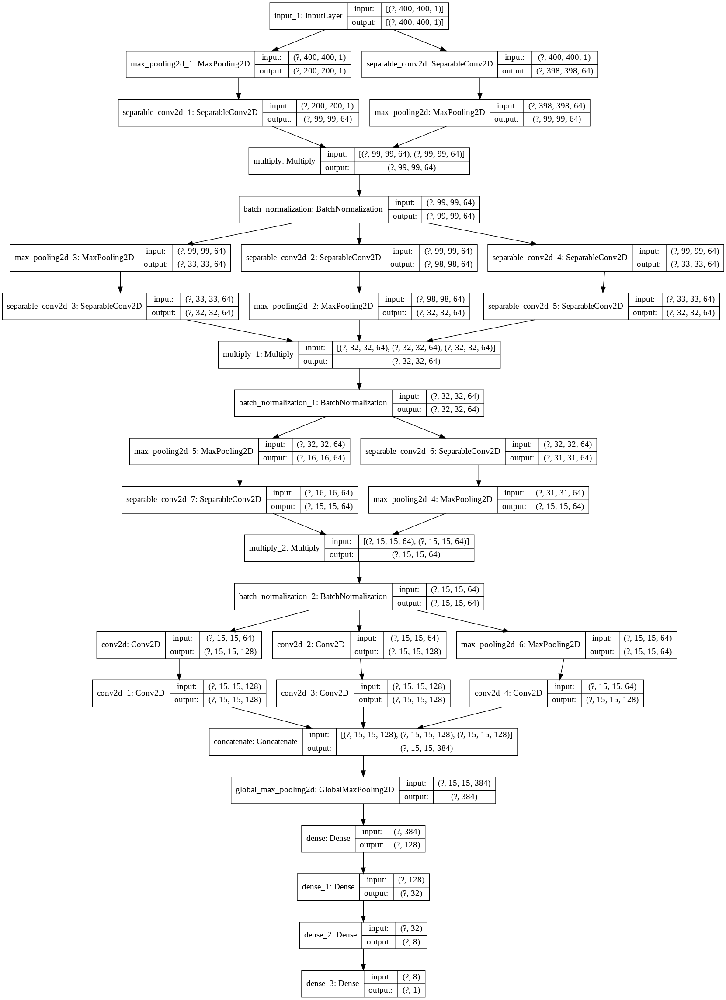

In [43]:
from tensorflow.keras.utils import plot_model
model = create_model()
model.summary()
plot_model(model,'Model.png',show_shapes=True)

In [0]:
optimizer = tf.keras.optimizers.Adam()
model.compile(loss='binary_crossentropy',optimizer=optimizer,weighted_metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.AUC()])

In [0]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('CheckpointChannel1.h5',save_best_only=True,verbose=1)
checkpoint_recall = tf.keras.callbacks.ModelCheckpoint('CheckpointRecall1.h5',monitor='val_recall',verbose=1,save_best_only=True,mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(patience=4,verbose=1)

In [0]:
tf.keras.backend.clear_session()

In [47]:
history = model.fit(train_dataset,validation_data=val_dataset,epochs=20,callbacks=[checkpoint,checkpoint_recall])

Epoch 1/20
   2663/Unknown - 131s 49ms/step - loss: 0.5587 - accuracy: 0.6992 - precision: 0.7429 - recall: 0.4754 - auc: 0.7752
Epoch 00001: val_loss improved from inf to 0.44709, saving model to CheckpointChannel1.h5

Epoch 00001: val_recall improved from -inf to 0.67814, saving model to CheckpointRecall1.h5
2664/2664 [==============================] - 136s 51ms/step - loss: 0.5587 - accuracy: 0.6992 - precision: 0.7429 - recall: 0.4755 - auc: 0.7752 - val_loss: 0.4471 - val_accuracy: 0.8100 - val_precision: 0.9463 - val_recall: 0.6781 - val_auc: 0.9008
Epoch 2/20
2663/2664 [============================>.] - ETA: 0s - loss: 0.4214 - accuracy: 0.8179 - precision: 0.8065 - recall: 0.7668 - auc: 0.8862
Epoch 00002: val_loss improved from 0.44709 to 0.34327, saving model to CheckpointChannel1.h5

Epoch 00002: val_recall improved from 0.67814 to 0.81174, saving model to CheckpointRecall1.h5
2664/2664 [==============================] - 135s 51ms/step - loss: 0.4213 - accuracy: 0.8180 - pre

In [63]:
model = tf.keras.models.load_model('/content/CurrentBest.h5')

In [64]:
model.evaluate(val_dataset,verbose=1)

59/59 [==============================] - 1s 22ms/step - loss: 0.2469 - accuracy: 0.9082 - precision: 0.8969 - recall: 0.9332 - auc: 0.9679


[0.24686221778392792,
 0.90821772813797,
 0.8968871831893921,
 0.9331983923912048,
 0.9678671956062317]

In [62]:
from collections import Counter
predictions = []
for i in glob.glob('/content/Images/*'):
  img = open(i,'rb').read()
  image = tf.image.decode_jpeg(img,channels=1)
  img = tf.cast(image,tf.float32) *(1./255)
  img = tf.image.resize(img,(400,400))
  img1 = tf.expand_dims(img,axis=0)
  pred = model.predict(img1)
  pred1 = "Negative" if pred[0]<0.35 else "Positive" # Reduced threshold because False Positives are better than False Negatives
  predictions.append(pred1)
  print(i,pred1)
print(Counter(predictions))

/content/Images/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-000-fig1a.png Positive
/content/Images/NORMAL2-IM-1333-0001.jpeg Negative
/content/Images/NORMAL2-IM-1327-0001.jpeg Negative
/content/Images/NORMAL2-IM-1328-0001.jpeg Negative
/content/Images/NORMAL2-IM-1335-0001.jpeg Negative
/content/Images/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-001-fig2a.png Positive
/content/Images/lancet-case2b.jpg Positive
/content/Images/NORMAL2-IM-1323-0001.jpeg Negative
/content/Images/nejmc2001573_f1a.jpeg Positive
/content/Images/NORMAL2-IM-1321-0001.jpeg Negative
/content/Images/NORMAL2-IM-1330-0001.jpeg Negative
/content/Images/NORMAL2-IM-1320-0001.jpeg Negative
/content/Images/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-000-fig1b.png Positive
/content/Images/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-003-fig4b.png Positive
/content/Images/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png Positive
/content/Images/NORMAL2-IM-1329-0001.jpeg Negative
/content/Images/NORMA

In [0]:
class GradCAM:
	def __init__(self, model, classIdx, layerName=None):
		# store the model, the class index used to measure the class
		# activation map, and the layer to be used when visualizing
		# the class activation map
		self.model = model
		self.classIdx = classIdx
		self.layerName = layerName

		# if the layer name is None, attempt to automatically find
		# the target output layer
		if self.layerName is None:
			self.layerName = self.find_target_layer()

	def find_target_layer(self):
		# attempt to find the final convolutional layer in the network
		# by looping over the layers of the network in reverse order
		for layer in reversed(self.model.layers):
			# check to see if the layer has a 4D output
			if len(layer.output_shape) == 4:
				return layer.name

		# otherwise, we could not find a 4D layer so the GradCAM
		# algorithm cannot be applied
		raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")

	def compute_heatmap(self, image, eps=1e-8):
		# construct our gradient model by supplying (1) the inputs
		# to our pre-trained model, (2) the output of the (presumably)
		# final 4D layer in the network, and (3) the output of the
		# softmax activations from the model
		gradModel = tf.keras.models.Model(
			inputs=[self.model.inputs],
			outputs=[self.model.get_layer(self.layerName).output, 
				self.model.output])

		# record operations for automatic differentiation
		with tf.GradientTape() as tape:
			# cast the image tensor to a float-32 data type, pass the
			# image through the gradient model, and grab the loss
			# associated with the specific class index
			inputs = tf.cast(image, tf.float32)
			(convOutputs, predictions) = gradModel(inputs)
			loss = predictions[:, self.classIdx]
			
		grads = tape.gradient(loss, convOutputs)
		castConvOutputs = tf.cast(convOutputs > 0, "float32")
		castGrads = tf.cast(grads > 0, "float32")
		guidedGrads = castConvOutputs * castGrads * grads
		convOutputs = convOutputs[0]
		guidedGrads = guidedGrads[0]
		weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
		cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
		(w, h) = (image.shape[2], image.shape[1])
		heatmap = cv2.resize(cam.numpy(), (w, h))
		numer = heatmap - np.min(heatmap)
		denom = (heatmap.max() - heatmap.min()) + eps
		heatmap = numer / denom
		heatmap = (heatmap * 255).astype("uint8")
		return heatmap

	def overlay_heatmap(self, heatmap, image, alpha=0.5,colormap=cv2.COLORMAP_VIRIDIS):
		heatmap = cv2.applyColorMap(heatmap,colormap)
		image = np.squeeze(image)
		image = cv2.resize(cv2.cvtColor(image,cv2.COLOR_GRAY2RGB),(400,400))
		output = cv2.addWeighted(image,0.5,heatmap,0.5,0)
		return (heatmap, output)

1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-000-fig1a.png


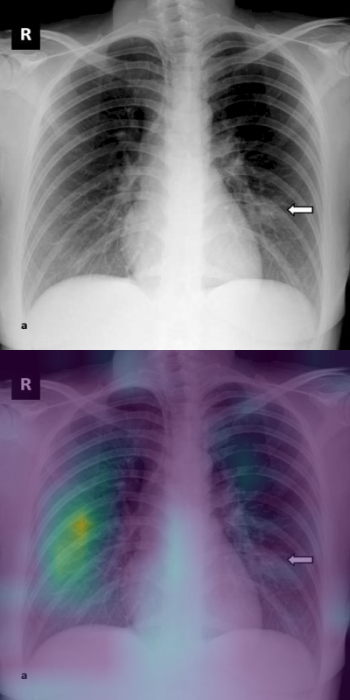

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1333-0001.jpeg


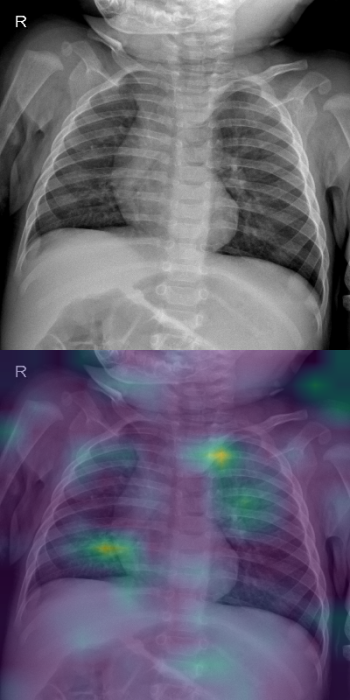

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1327-0001.jpeg


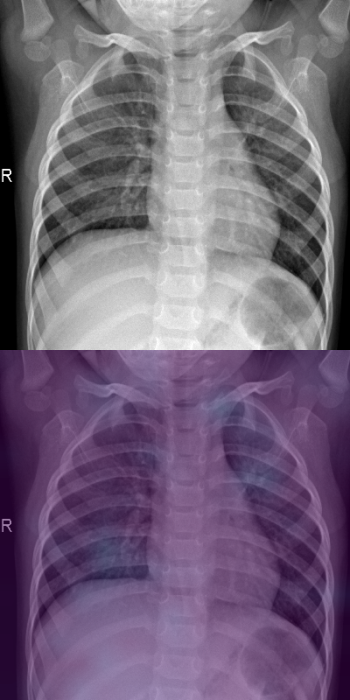

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1328-0001.jpeg


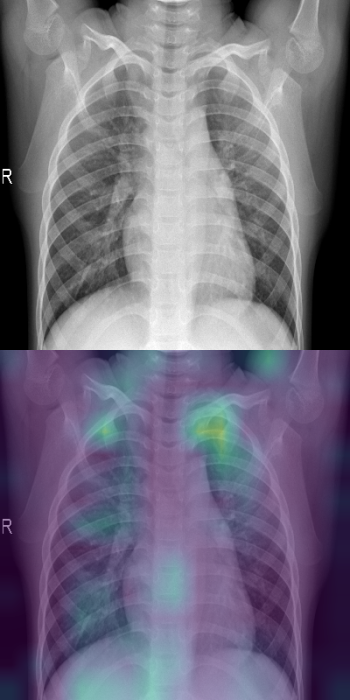

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1335-0001.jpeg


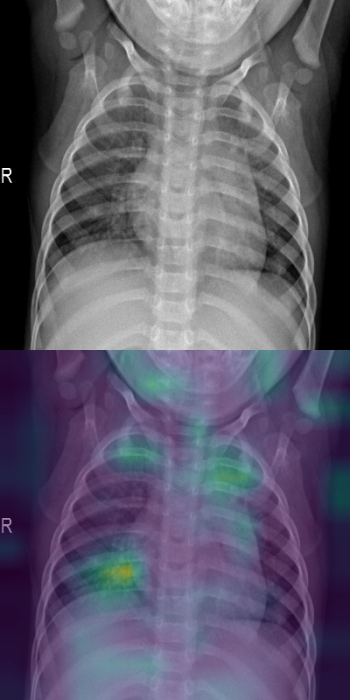

Negative 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-001-fig2a.png


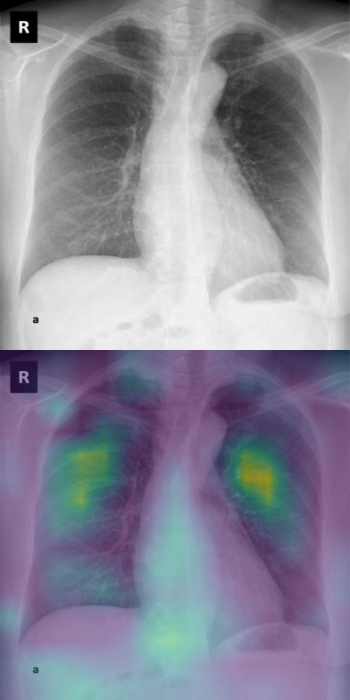

Positive 
-----------------------------------------------------------------------------------
lancet-case2b.jpg


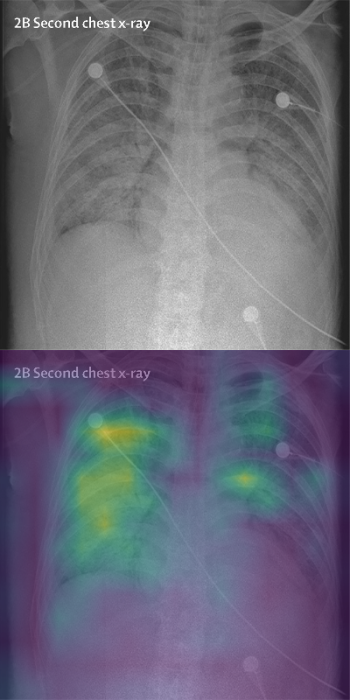

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1323-0001.jpeg


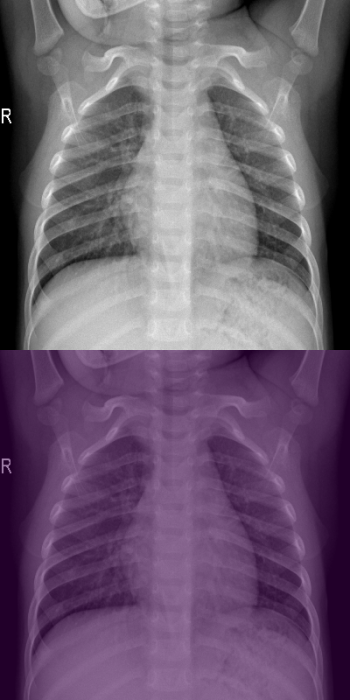

Negative 
-----------------------------------------------------------------------------------
nejmc2001573_f1a.jpeg


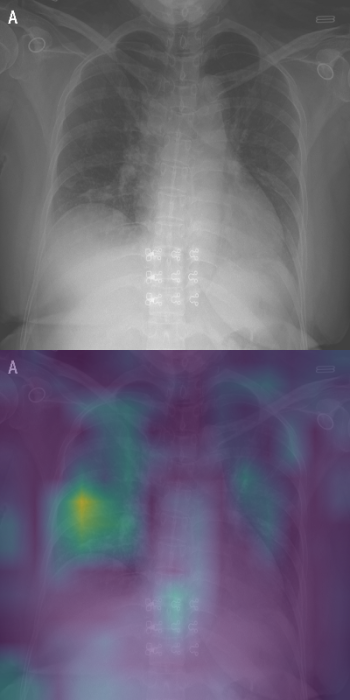

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1321-0001.jpeg


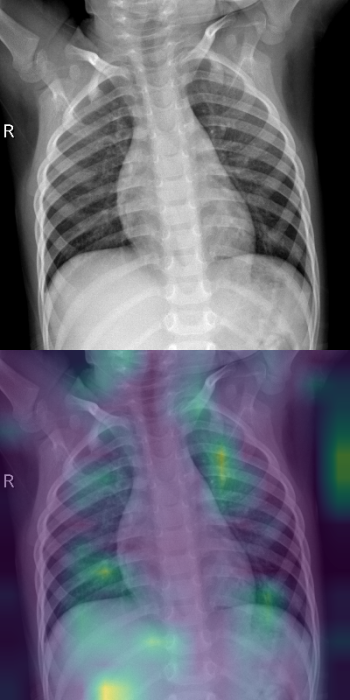

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1330-0001.jpeg


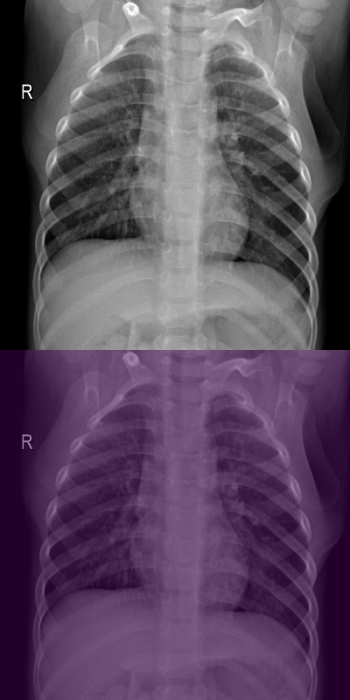

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1320-0001.jpeg


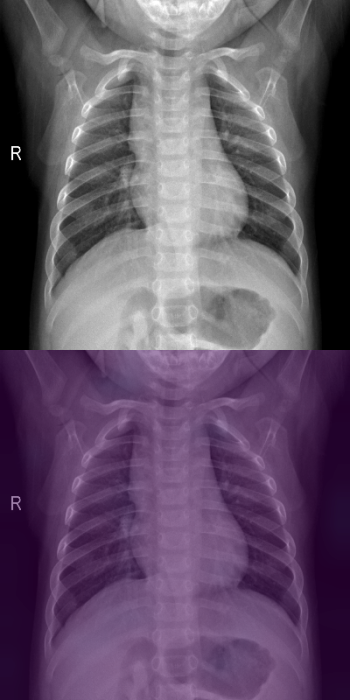

Negative 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-000-fig1b.png


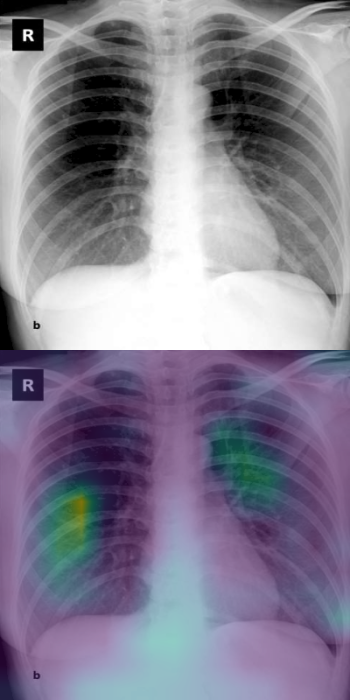

Positive 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-003-fig4b.png


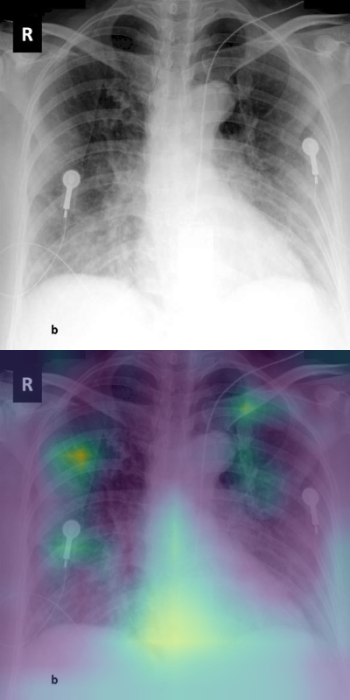

Positive 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png


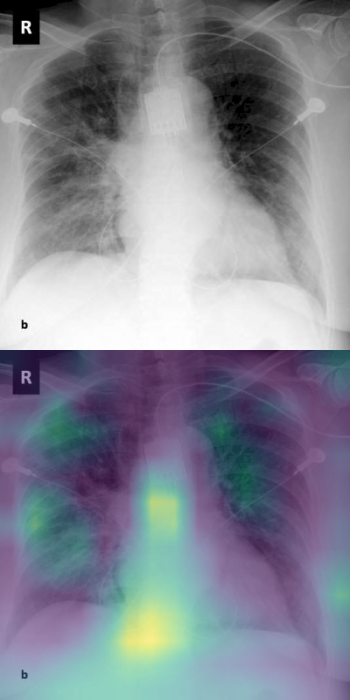

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1329-0001.jpeg


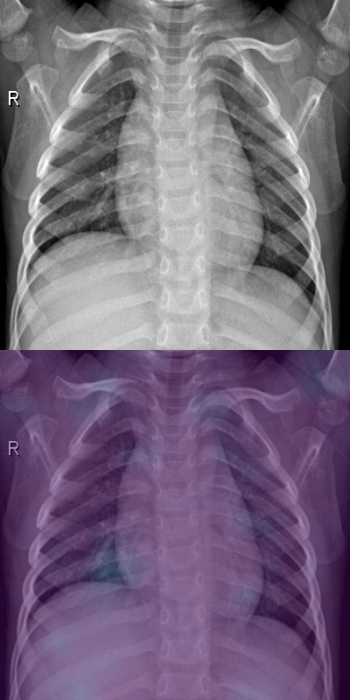

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1315-0001.jpeg


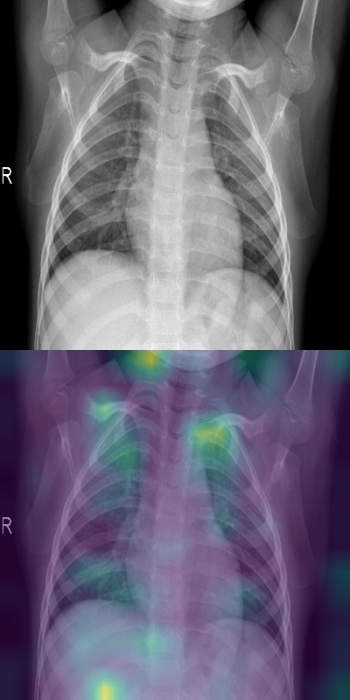

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1332-0001.jpeg


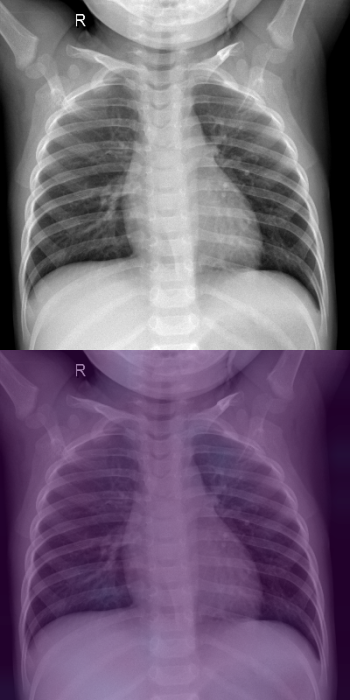

Negative 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-001-fig2b.png


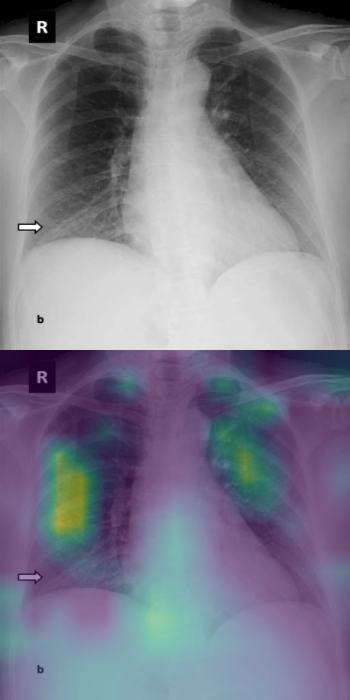

Positive 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-003-fig4a.png


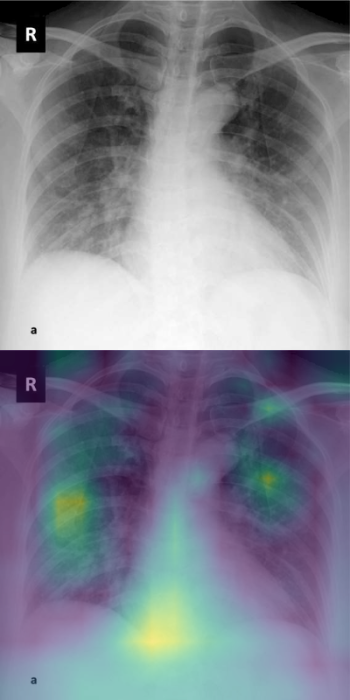

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1334-0001.jpeg


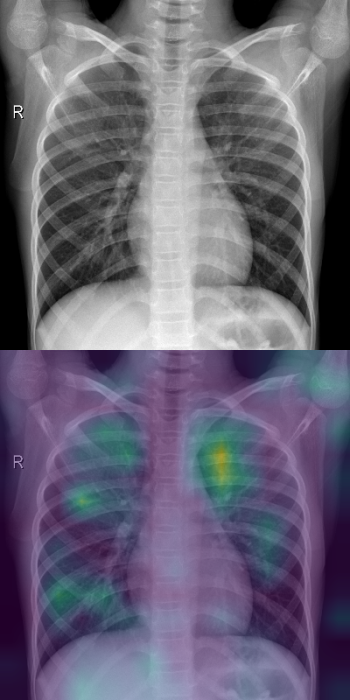

Negative 
-----------------------------------------------------------------------------------
legionella-pneumonia-1.png


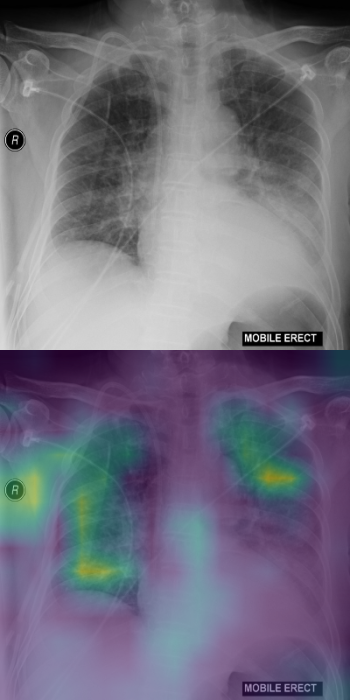

Negative 
-----------------------------------------------------------------------------------
MERS-CoV-1-s2.0-S0378603X1500248X-gr4e.jpg


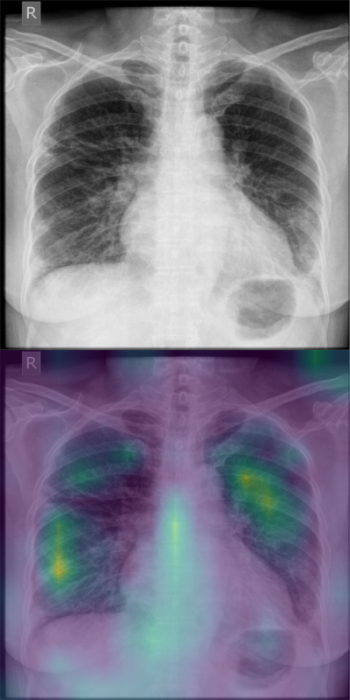

Positive 
-----------------------------------------------------------------------------------
nejmc2001573_f1b.jpeg


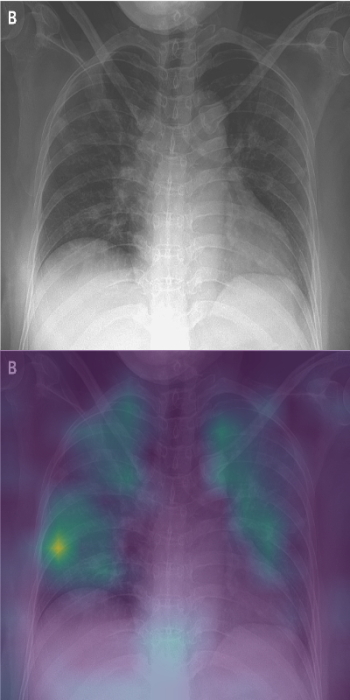

Positive 
-----------------------------------------------------------------------------------
nCoV-radiol.2020200269.fig1-day7.jpeg


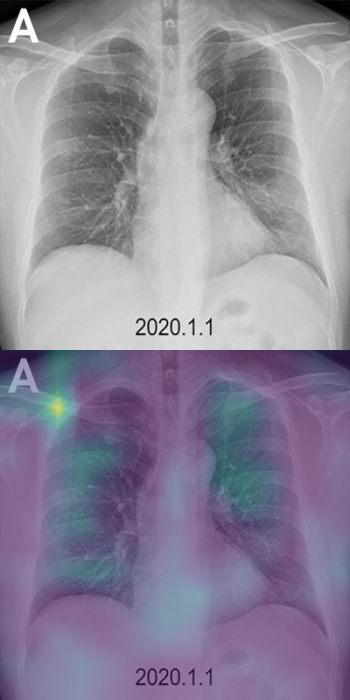

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1336-0001.jpeg


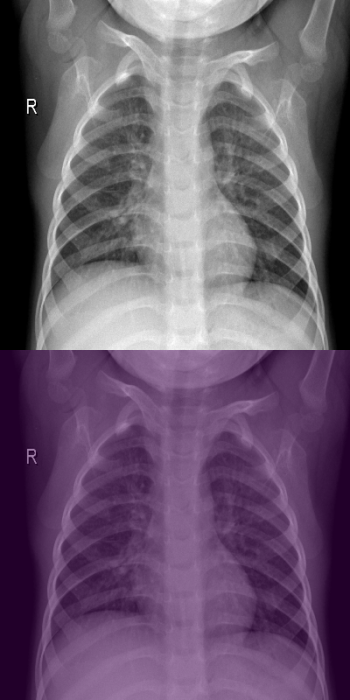

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1316-0001.jpeg


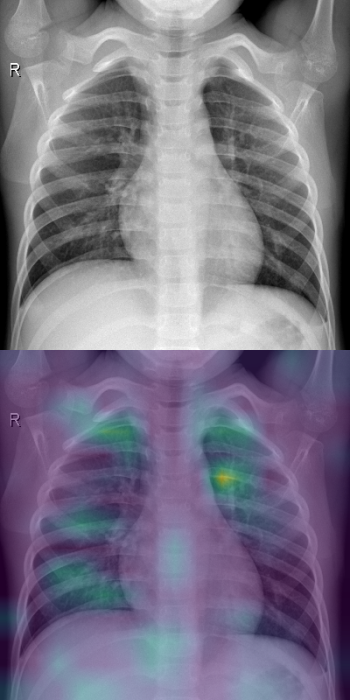

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1322-0001.jpeg


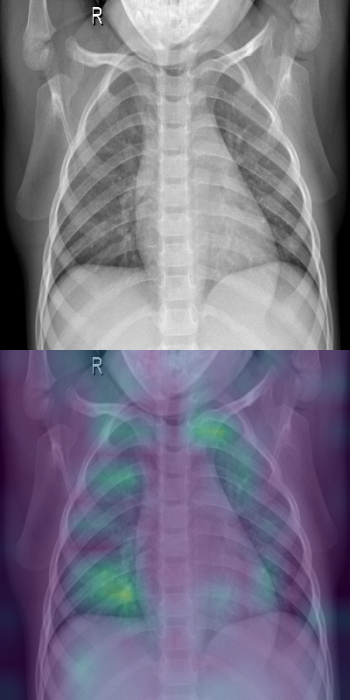

Negative 
-----------------------------------------------------------------------------------
legionella-pneumonia-2.jpg


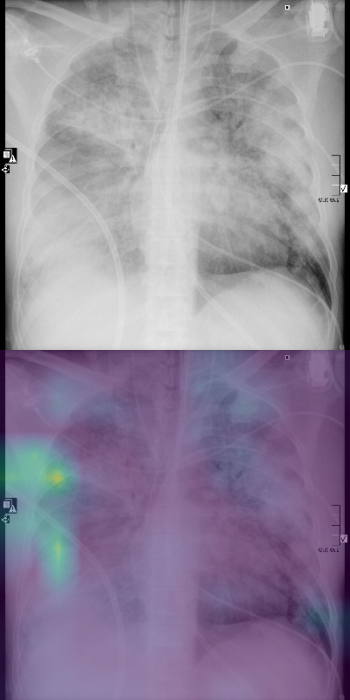

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1318-0001.jpeg


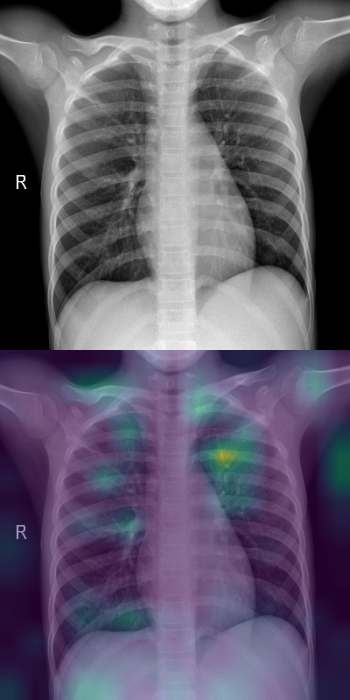

Negative 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3a.png


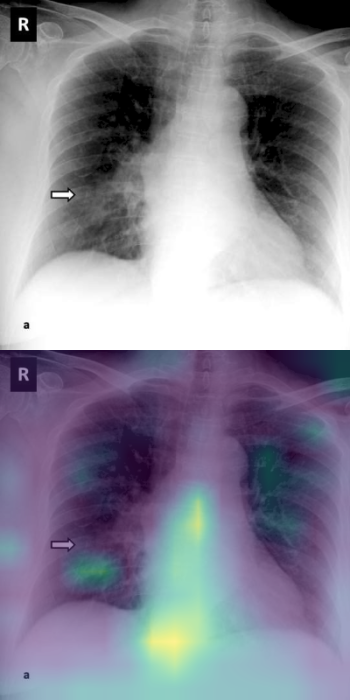

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1317-0001.jpeg


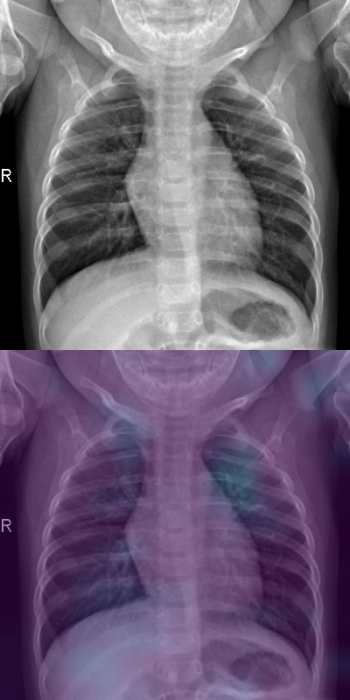

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1326-0001.jpeg


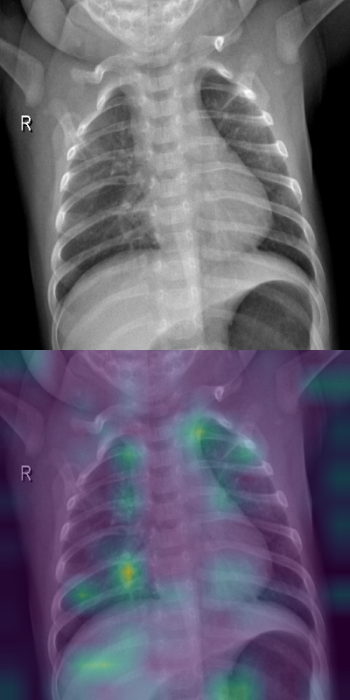

Positive 
-----------------------------------------------------------------------------------
1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b (1).png


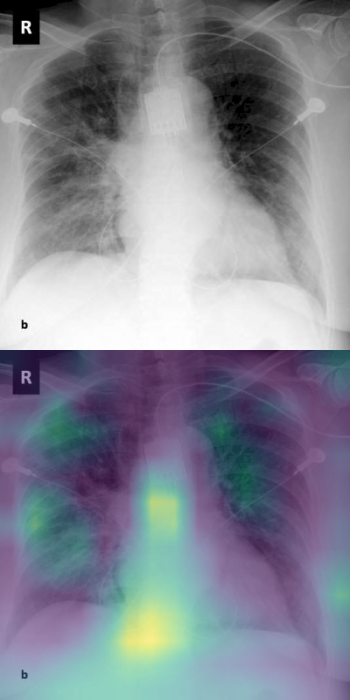

Positive 
-----------------------------------------------------------------------------------
nCoV-Snohomish-20382862_web1_M1-Lungs-EDH-200201-640x300@2x.jpg


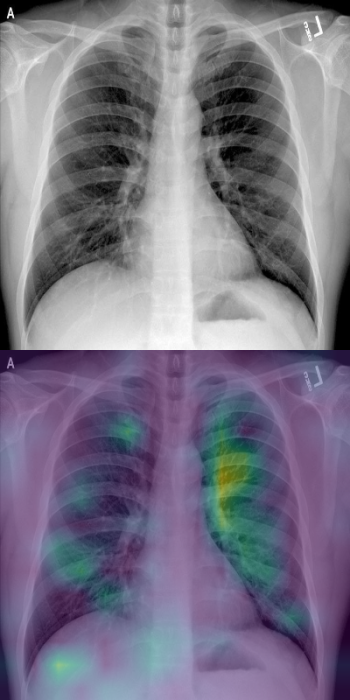

Negative 
-----------------------------------------------------------------------------------
lancet-case2a.jpg


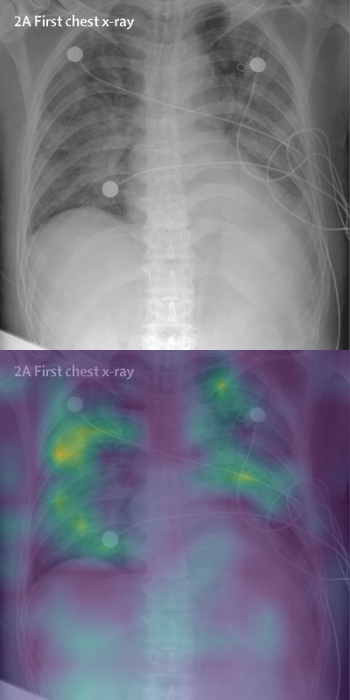

Positive 
-----------------------------------------------------------------------------------
NORMAL2-IM-1319-0001.jpeg


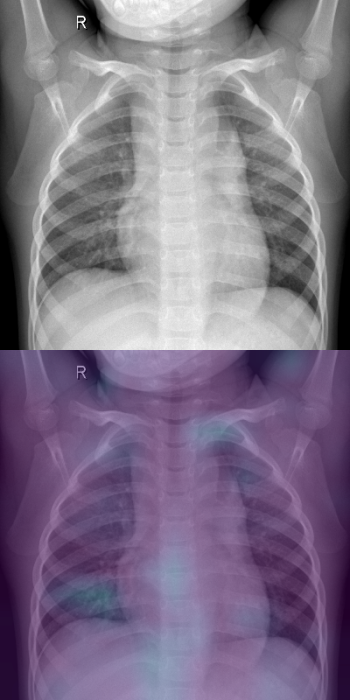

Negative 
-----------------------------------------------------------------------------------
NORMAL2-IM-1337-0001.jpeg


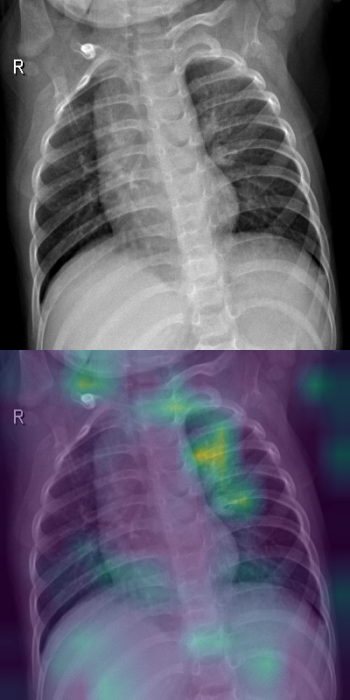

Negative 
-----------------------------------------------------------------------------------


In [58]:
from google.colab.patches import cv2_imshow
from matplotlib.cm import viridis
import imutils

for i in reversed(model.layers):
        if len(i.output.shape)==4:
            visualising_layer = i.name
            break    

for i in glob.glob('/content/Images/*'):
  filename = i.split('/')[-1]
  if filename.split('.')[-1] == 'jfif':
    continue
  print(filename) 
 
  img = open(i,'rb').read()
  image = tf.image.decode_jpeg(img,channels=1)
  img = tf.cast(image,tf.float32) *(1./255)
  # img = tf.image.central_crop(img,0.85)
  img = tf.image.resize(img,(400,400))
  img1 = tf.expand_dims(img,axis=0) 
  pred = model.predict(img1) 
  gc = GradCAM(model,0,layerName=visualising_layer)

  heatmap = gc.compute_heatmap(img1)
  heatmap = cv2.resize(heatmap,(400,400))

  (heatmap, output) = gc.overlay_heatmap(heatmap,image, alpha=0.5)
  image = cv2.resize(cv2.cvtColor(np.array(image),cv2.COLOR_GRAY2RGB),(400,400))
  output = np.vstack([image, output])
  output = imutils.resize(output, height=700)
  cv2_imshow(output)
  # cv2.imwrite('/content/drive/My Drive/PredictionVisualisations/'+filename,output,pred)
  pred = "Negative" if pred[0]<0.35 else "Positive"
  print(pred,"\n-----------------------------------------------------------------------------------")

In [0]:
model.save('OpacityDetector.h5')